<h1 align="center">Volume 2: The Fourier Transform.</h1>

    <Name>
    <Class>
    <Date>

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [44]:
from matplotlib import pyplot as plt
import numpy as np
from scipy.io import wavfile
import IPython
from scipy.fftpack import fft
from scipy.fftpack import ifft
import time
import math
from scipy.signal import fftconvolve
import imageio
from scipy.fftpack import fft2, ifft2

In [3]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [4]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples
        

    # Problems 1.1 and 1.7
    def plot(self, show_frequencies = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        #Calculate the amount of time the sound plays
        time = len(self.samples) / self.rate
        #Prepare x-axis for plot
        x_axis = np.linspace(0, time, len(self.samples))
        
        #if we are showing frequency plot
        if show_frequencies:
            #Make sure that we only include the first half of frequencies 
            frequencies = np.array(list(range(len(self.samples) // 2))) / time
            c = np.abs(fft(self.samples))[:len(self.samples) // 2]
            
            
            plt.figure(1)
            plt.subplot(2,1,1)
            plt.plot(x_axis, self.samples)
            plt.ylim(-32768, 32767)
            plt.title("Sound")
            plt.xlabel("Time (seconds)")
            plt.ylabel("Samples")
            plt.show()
            #Display the frequency plot
            plt.subplot(2,1,2)
            plt.title("Frequencies")
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Intensity")
            plt.plot(frequencies, c)
            
            plt.show()
        
        else:
            #Display the regular sound plot
            plt.figure(1)
            plt.plot(x_axis, self.samples)
            plt.ylim(-32768, 32767)
            plt.title("Sound")
            plt.xlabel("Time (seconds)")
            plt.ylabel("Samples")
            plt.show()
        

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        audio = np.copy(self.samples)
        #If the sound isn't the right type we force it 
        if np.dtype('int16') != audio.dtype:
            force = True
            
        
        #we adjust the sound if we force it 
        if force == True:
            audio = np.array(((audio * 32767.0) / np.max(audio))).astype("int16")
        
        #write the file
        wavfile.write(filename, self.rate, audio)
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #check errror conditions
        if len(self.samples) != len(other.samples):
            raise ValueError("Sample Arrays are not same length")
        
        #add the waves together
        return SoundWave(self.rate, self.samples + other.samples)

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #check errror conditions
        if self.rate != other.rate:
            raise ValueError("Sounds don't have same sampling rate")
        
        #add the right amount of empty noise and the concatenate waves together
        my_wait = np.zeros(len(other.samples))
        other_wait = np.zeros(len(self.samples))
        new_samples = np.concatenate([self.samples, my_wait]) + np.concatenate([other_wait, other.samples])
        
        return SoundWave(self.rate, new_samples)
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #check error conditions
        if len(self.samples) != len(other.samples):
            raise ValueError("Sample Arrays are not same length")
        
        #convolve the waves together
        
        convolv = np.fft.ifft(np.multiply(np.fft.fft(self.samples), np.fft.fft(other.samples)))
        
        return SoundWave(self.rate, convolv)
        

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #check error conditions
        if len(self.samples) != len(other.samples):
            raise ValueError("Sample Arrays are not same length")
        
        #Calculate the value of a
        a = int(math.ceil(np.log2(2 * len(self.samples) - 1)))
        
        #Adjust the sounds and then convolve
        self_sound = np.concatenate([self.samples, np.zeros(2**a - len(self.samples))])
        other_sound = np.concatenate([other.samples, np.zeros(2**a - len(self.samples))])
        convolve = np.fft.ifft(np.multiply(np.fft.fft(self_sound), np.fft.fft(other_sound)))
        
        return SoundWave(self.rate, convolve[:2 * len(self.samples) - 1])
        
        
        

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #Calculate the time, frequencies and the fourier transform
        time = len(self.samples) / self.rate
        frequencies = np.array(list(range(len(self.samples)))) / time
        c = fft(self.samples)
        n = len(self.samples)
        
        #Decide which frequencies we wish to send to zero
        mask1 = np.logical_and(frequencies >= low_freq, frequencies <= high_freq) 
        mask2 = np.logical_and(frequencies >= frequencies[-1] - high_freq, frequencies <= frequencies[-1] - low_freq)
        
        #Filter out frequencies and the return new sound
        mask1 = np.logical_not(mask1)
        mask2 = np.logical_not(mask2)
        clean_freq = np.multiply(mask1, c)
        clean_freq = np.multiply(mask2, clean_freq)
        
        return  SoundWave(self.rate, ifft(clean_freq))
        

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

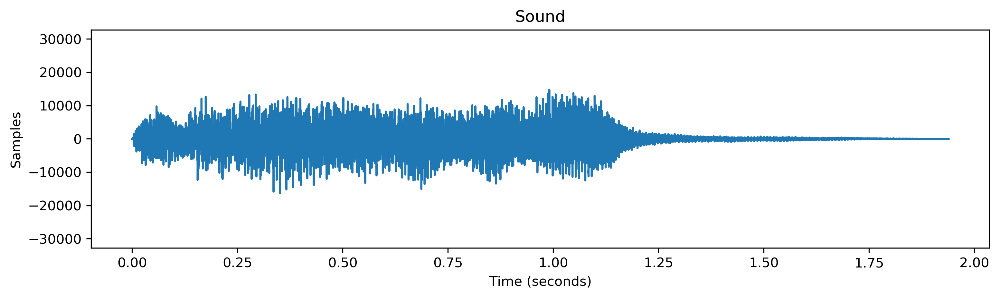

In [5]:
#collect the rate and samples from tada file 
rate, samples = wavfile.read("tada.wav")
#make the soundwave object and plot sound
tada = SoundWave(rate, samples)
tada.plot()


### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [6]:
#play original sound
IPython.display.Audio(filename = "tada.wav")

In [7]:
#Create the unscaled sound
tada_unscaled = SoundWave(rate, samples)
tada_unscaled.export("tada_unscaled.wav", force=False)

#play unscaled sound
IPython.display.Audio(filename = "tada_unscaled.wav")

In [8]:
#Create the scaled sound
tada_scaled = SoundWave(rate, samples)
tada_scaled.export("tada_scaled.wav", force=True)

#play scaled sound
IPython.display.Audio(filename = "tada_scaled.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [9]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #init sample rate
    sample_rate = 44100
    
    #init x and then sample from sine function
    x = np.array(list(range(sample_rate * duration))) / sample_rate
    samples = np.sin(2 * np.pi * x * frequency)
    
    return SoundWave(sample_rate, samples)
        
    

In [10]:
#Generate the note A
sw = generate_note(440, 2)
sw.export("note_A.wav")

#Play note
IPython.display.Audio(filename = "note_A.wav")

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [11]:
#Generate an A, C and an E node and make the chord
A = generate_note(440, 3)
C = generate_note(523.25, 3)
E = generate_note(659.25, 3)
chord = (A + C) + E
chord.export("A_minor_chord.wav")

#play the chord
IPython.display.Audio(filename = "A_minor_chord.wav")

In [12]:
#Generate an A, C and an E node and make the arpeggio
A = generate_note(440, 1)
C = generate_note(523.25, 1)
E = generate_note(659.25, 1)
arpeggio = (A >> C) >> E
arpeggio.export("A_minor_arpeggio.wav")

#play the arpeggio
IPython.display.Audio(filename = "A_minor_arpeggio.wav")

### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [13]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #find the num of samples
    num_samples = len(samples)
    #make the Fn matrix by making the k and n components and performing the outer product
    k = np.array([- 2 * np.pi * 1j * k  for k in range(num_samples)])
    n = np.array([n / num_samples for n in range(num_samples)])
    Fn = (1/num_samples) * np.exp(np.outer(k, n))
    #calculate c
    c = Fn @ samples
    
    return c
    
    

In [14]:
#generate random sound sample
random_samples = np.random.randint(-32768, 32767, 2048)

#calculate the DFT using scipy and my own function
computed_c = fft(random_samples) / 2048.
my_c = simple_dft(random_samples)


#test my code 
if np.all(np.isclose(computed_c, my_c)):
    print("Test Passed - my computed DFT matches Scipy's DFT")
else:
    print("Test Failed - my computed DFT doesn't match Scipy's DFT")
    



Test Passed - my computed DFT matches Scipy's DFT


### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [15]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #Build the split function
    def SPLIT(g):
        n = len(g)
        if n <= threshold:
            return n * simple_dft(g) # Use the function from Problem 5 for small enough g.
        else:
            even = SPLIT(g[::2]) # Get the DFT of every other entry of g, starting from 0.
            odd = SPLIT(g[1::2]) # Get the DFT of every other entry of g, starting from 1
            z = np.exp(np.array([-2 * np.pi * 1j * k / n for k in range(n)])) # Calculatetheexponentialpartsofthesum.
            m = n // 2
            
            return np.concatenate([even + np.multiply(z[:m], odd), even + np.multiply(z[m:], odd)]) # Concatenate two arrays of length m
            
    return SPLIT(samples) / len(samples)
    
        
    

In [16]:
#Generate a random sound
random_samples = np.random.randint(-32768, 32767, 8192)

#Use and time problem 5
tic_5 = time.time()
prob_5 = simple_dft(random_samples)
toc_5 = time.time()

#Use and time problem 6
tic_6 = time.time()
prob_6 = simple_fft(random_samples) 
toc_6 = time.time()

#Use scipy's solution
scipy_c = fft(random_samples) / 8192

#Test code and print results
if (np.all(np.isclose(scipy_c, prob_6))):
    print("Test Passed - my computed DFT matches Scipy's DFT")
else:
    print("Test Failed - my computed DFT doesn't match Scipy's DFT")

print("Problem 5's code took {} seconds".format(toc_5 - tic_5))
print("Problem 6's code took {} seconds".format(toc_6 - tic_6))

Test Passed - my computed DFT matches Scipy's DFT
Problem 5's code took 4.3405609130859375 seconds
Problem 6's code took 0.41672706604003906 seconds


### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

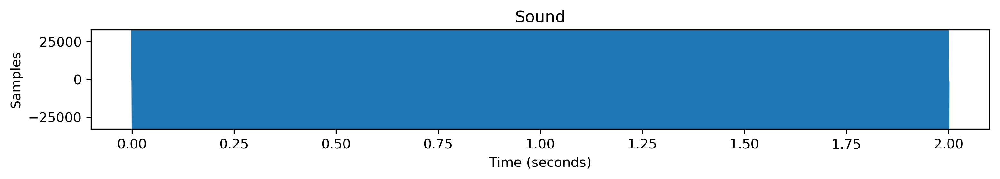

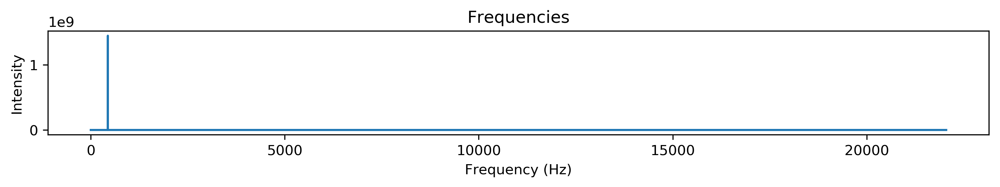

In [17]:
#import and plot the note A
rate, samples = wavfile.read("note_A.wav")
A = SoundWave(rate, samples)
A.plot(True)

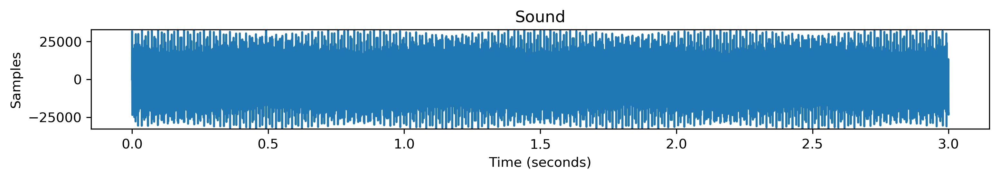

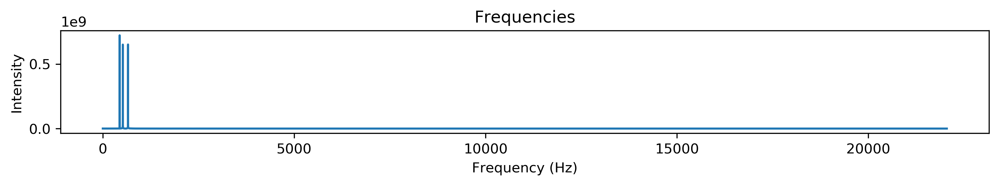

In [18]:
#import and plot the a minor chord
rate, samples = wavfile.read("A_minor_chord.wav")
A_min = SoundWave(rate, samples)
A_min.plot(True)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

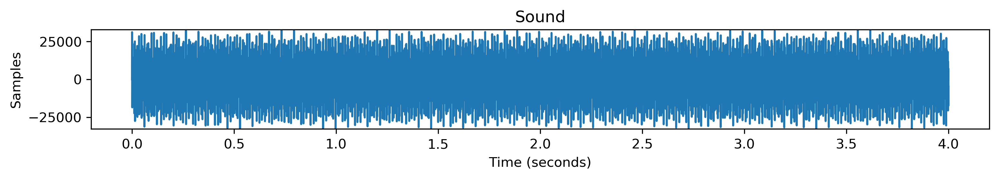

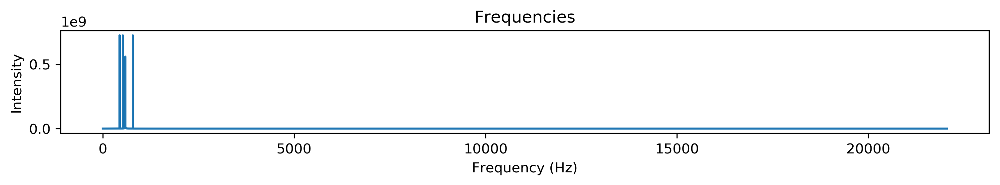

In [19]:
#find the rate and samples for the mystery chord
rate, samples = wavfile.read("mystery_chord.wav")

#Plot the mystery chord and frequencies 
mystery = SoundWave(rate, samples)
mystery.plot(True)


In [20]:
#calculate sound duration and the frequencies and the FDT
time = len(samples) / mystery.rate
frequencies = np.array(list(range(len(samples) // 2))) / time
c = np.abs(fft(samples))[:len(samples) // 2] 

#Filter out all frequencies that arent very loud
mask = c > 4 * 10 ** 8
print(sum(mask))
#Return the frequencies that are the loudest
print(frequencies[mask])

4
[440.   523.25 587.5  784.  ]


The notes are A, C, D and G

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [21]:
# Create 2 seconds of white noise at a given rate.
rate = 22050        
white_noise = np.random.randint(-32767, 32767, 42752, dtype=np.int16)

white_sound = SoundWave(rate, white_noise)

#create convolution and append it to itself
tada_conv = tada * white_sound >> tada * white_sound


tada_conv.export("tada_convolution.wav", force=False)

#play convolved sound
IPython.display.Audio(filename = "tada_convolution.wav")


/Users/jacobclark/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:75: ComplexWarning: Casting complex values to real discards the imaginary part


### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [22]:
rate, samples = wavfile.read("GCG.wav")
#make the soundwave object and display
GCG = SoundWave(rate, samples)
IPython.display.Audio(filename = "GCG.wav")

In [23]:
rate, samples = wavfile.read("CGC.wav")
#make the soundwave object and display
CGC = SoundWave(rate, samples)
IPython.display.Audio(filename = "CGC.wav")

In [26]:

#Convolve GCG and CGC with my and scipy's method 
my_tic = time.time()
GCG_CGC_conv = GCG ** CGC
my_toc = time.time()

#Save the convolved sound
GCG_CGC_conv.export("GCG_CGC_conv.wav", force=False)

other_tic = time.time()
other_GCG_CGC_conv = SoundWave(rate, fftconvolve(GCG.samples, CGC.samples))
other_toc = time.time()

#Save the convolved sound
other_GCG_CGC_conv.export("other_GCG_CGC_conv.wav", force=False)

#Report the timing
print("My algorithm took {} seconds".format(my_toc - my_tic))
print("Scipy's algorithm took {} seconds".format(other_toc - other_tic))

My algorithm took 0.15876507759094238 seconds
Scipy's algorithm took 0.028896093368530273 seconds


/Users/jacobclark/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:75: ComplexWarning: Casting complex values to real discards the imaginary part


In [27]:
IPython.display.Audio(filename = "GCG_CGC_conv.wav")


In [28]:
IPython.display.Audio(filename = "other_GCG_CGC_conv.wav")

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [29]:
rate, samples = wavfile.read("chopin.wav")
#make the soundwave object and display sound
chopin = SoundWave(rate, samples)
IPython.display.Audio(filename = "chopin.wav")

In [30]:
rate, samples = wavfile.read("balloon.wav")
#make the soundwave object and display sound
balloon = SoundWave(rate, samples)
IPython.display.Audio(filename = "balloon.wav")

In [31]:
#Convolve the sounds
chopin_balloon_convolv = SoundWave(rate, fftconvolve(chopin.samples, balloon.samples))

#Save and display the new sound 
chopin_balloon_convolv.export("chopin_balloon_convolv.wav", force=False)
IPython.display.Audio(filename = "chopin_balloon_convolv.wav")


### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [32]:
rate, samples = wavfile.read("noisy1.wav")
#make the soundwave object and display sound
noisy1 = SoundWave(rate, samples)

#Filter out the frequencies
clean_noisy1 = noisy1.clean(1250, 2600)

#Save and display original sound
clean_noisy1.export("clean_noisy1.wav", force=False)
IPython.display.Audio(filename = "noisy1.wav")

/Users/jacobclark/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:75: ComplexWarning: Casting complex values to real discards the imaginary part


In [33]:
#Display filtered sound
IPython.display.Audio(filename = "clean_noisy1.wav")

In [34]:
rate, samples = wavfile.read("noisy2.wav")
#make the soundwave object and plot sound
noisy2 = SoundWave(rate, samples)

#Filter out the frequencies
clean_noisy2 = noisy2.clean(1250, 4400)

#Save and display original sound
clean_noisy2.export("clean_noisy2.wav", force=False)
IPython.display.Audio(filename = "noisy2.wav")

/Users/jacobclark/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:75: ComplexWarning: Casting complex values to real discards the imaginary part


In [35]:
#Display filtered sound
IPython.display.Audio(filename = "clean_noisy2.wav")

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [36]:
rate, samples = wavfile.read("vuvuzela.wav")
#Split up stereo sound
left_sample = samples.T[0]
right_sample = samples.T[1]

#make the soundwave objects
left_vuvu = SoundWave(rate, left_sample)
right_vuvu = SoundWave(rate, right_sample)

#Display original sound
IPython.display.Audio(filename = "vuvuzela.wav")

In [37]:
#Clean the vuvu sounds
clean_left_vuvu = left_vuvu.clean(200, 500)
clean_right_vuvu = right_vuvu.clean(200,500)

sound = np.array([clean_left_vuvu.samples, clean_right_vuvu.samples]).T

#Save the filtered sound
new_sound = SoundWave(rate, sound)
new_sound.export("clean_vuvuzela.wav", force=False)

#Display filtered sound
IPython.display.Audio(filename = "clean_vuvuzela.wav")


/Users/jacobclark/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:75: ComplexWarning: Casting complex values to real discards the imaginary part


### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

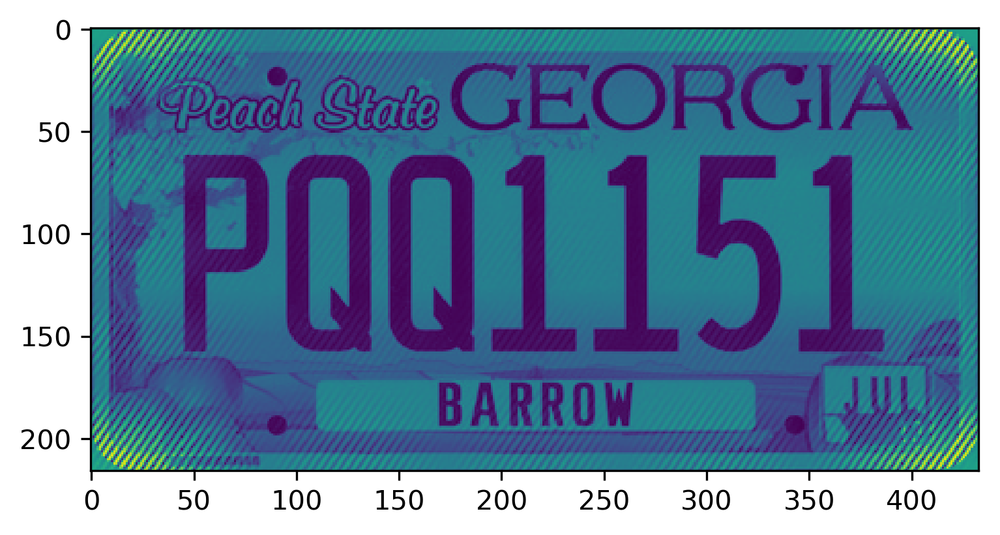

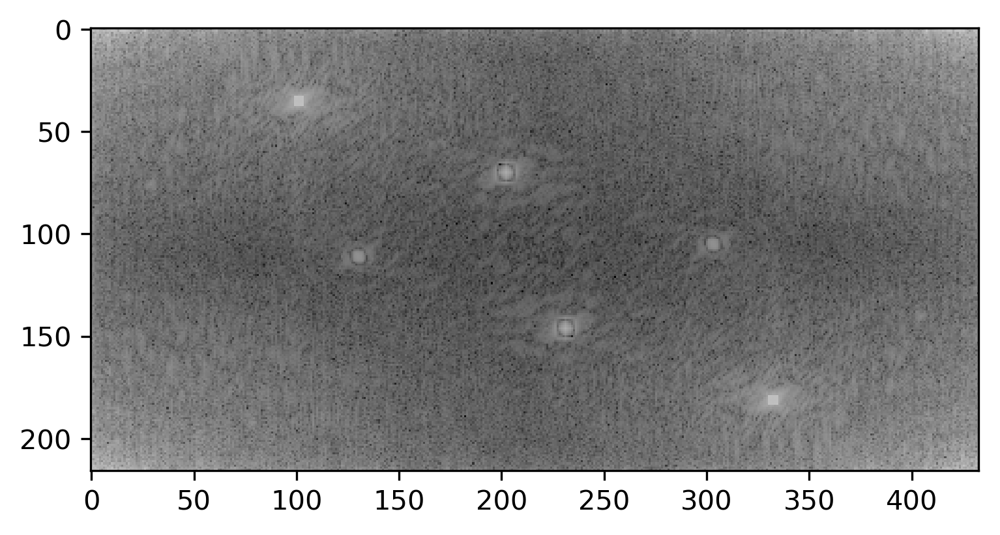

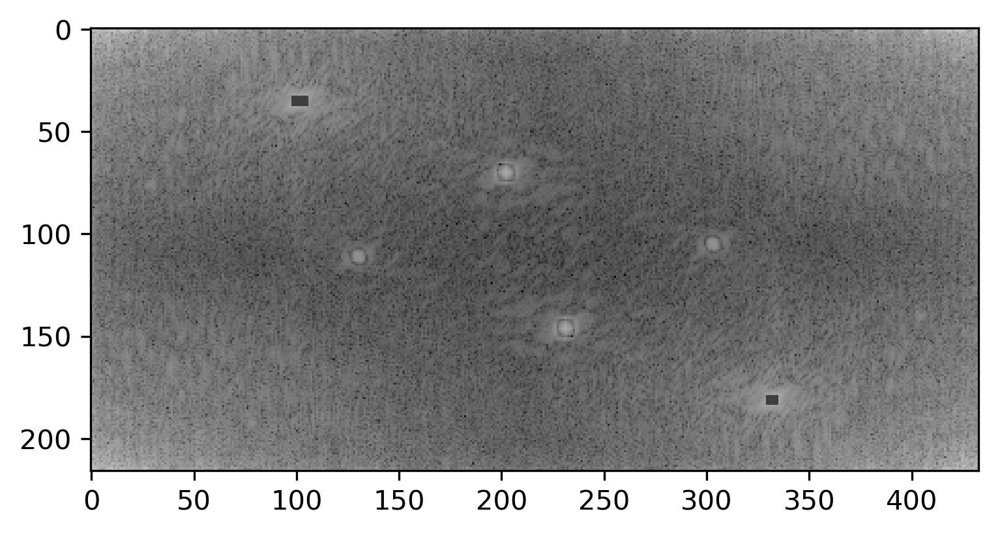

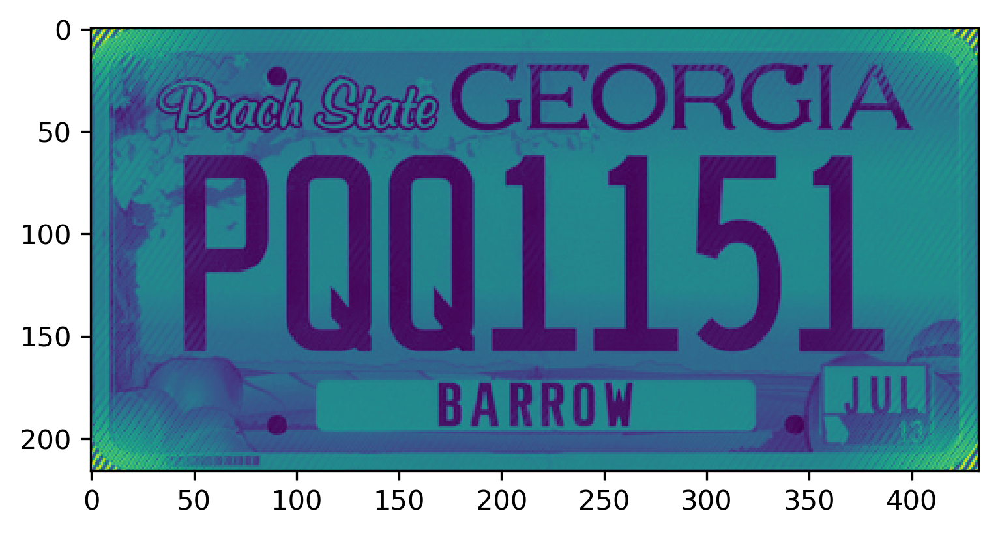

In [81]:
#Read the image in 
im = imageio.imread("license_plate.png")
#Perform the 2d fourier transform
im_dft = fft2(im)

#Find the average color of the image to make the patch
patch_color = np.average(im_dft)

#Show the original image
plt.imshow(im)
plt.show()

#Show the fft of the image
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

#fix patch one
im_dft[33:38, 98:106] = patch_color

#fix patch two
im_dft[179:184, 329:335] = patch_color

#display the patched fft of image
plt.imshow(np.log(np.abs(im_dft)), cmap="gray")
plt.show()

#perform inverse fourier transform and display iamge
new_im = ifft2(im_dft).real
plt.imshow(new_im)
plt.show()



The year on the sticker is 13